# Models de regressió bayesians

Una introducció a la llibreria Bambi com a eina per a modelar amb agilitat utilitzant models de regressió, models de regressió generalitzats o fins i tot alguns models additius generalitzats (per exemple splines o processos gaussians).

**Ponent:** Oriol Abril
**Lloc:** PyDay BCN 2025, Canòdrom Barcelona

## Preparació de llibreries i dades sintètiques

Per als primer exemples farem servir dades sintètiques. Això ens permetrà:

* Contrastar inferències amb els paràmetres reals
* Garantir models amb bon comportament i ràpids d'ajustar

Un cop introduïda la llibreria passarem a dades reals. Al repositori hi ha dades de lloguers de Berlin de fa uns anys, però si voleu fer servir un altre dataset. El dataset dels pinguins disponible a través de la llibreria [palmerpenguins](https://github.com/mcnakhaee/palmerpenguins) també serveix pels nostres propòsits, així mateix, també es possible fer servir dades tabulars vostres a les que us interessi fer un ajust de regressió i que combinin columnes contínues i discretes/categòriques.

In [2]:
%pip install "bambi>=0.16" "arviz>=0.22" "arviz-base>=0.7" "arviz-stats>=0.7" "arviz-plots>=0.7" ipywidgets statsmodels

In [3]:
import arviz as az
import arviz.preview as azp
import bambi as bmb
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr

SEED = 2611
az.style.use("arviz-doc")

print(bmb.__version__)

0.16.0


In [6]:
n = 1000
n_groups = 20
rng = np.random.default_rng(SEED)
# add 4 groups with less observations
p = np.array([1, 1, 1, 1] + [5]*(n_groups - 4), dtype=float)
groups = rng.choice(range(n_groups), size=n, p=p/p.sum())
intercepts = rng.normal(2, size=n_groups)
slopes = rng.gamma(2, 3, size=n_groups) / 3 + 0.2
x = rng.gamma(7, 3, size=n) / 5
synth_df = pd.DataFrame(
    {
        "x": x,
        "y": rng.normal(loc=intercepts[groups] + slopes[groups] * x, scale=1.3),
        "group": groups,
    }
)

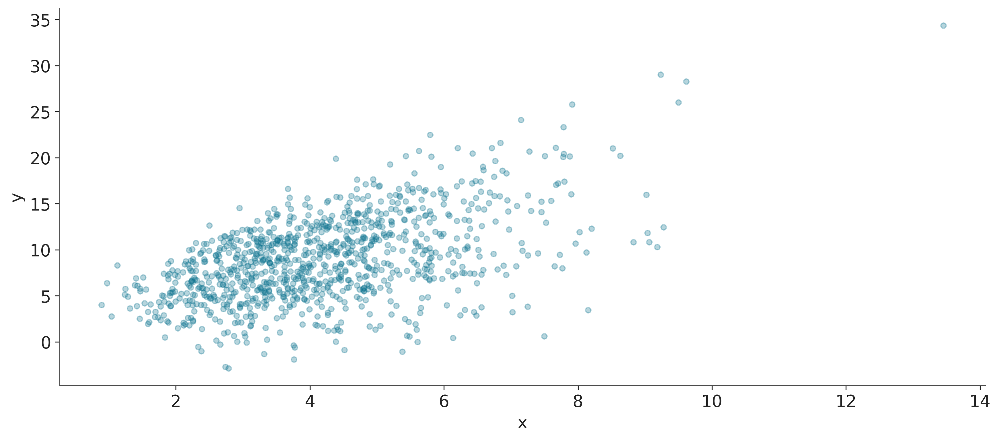

In [7]:
synth_df.plot.scatter(x="x", y="y", alpha=0.3);

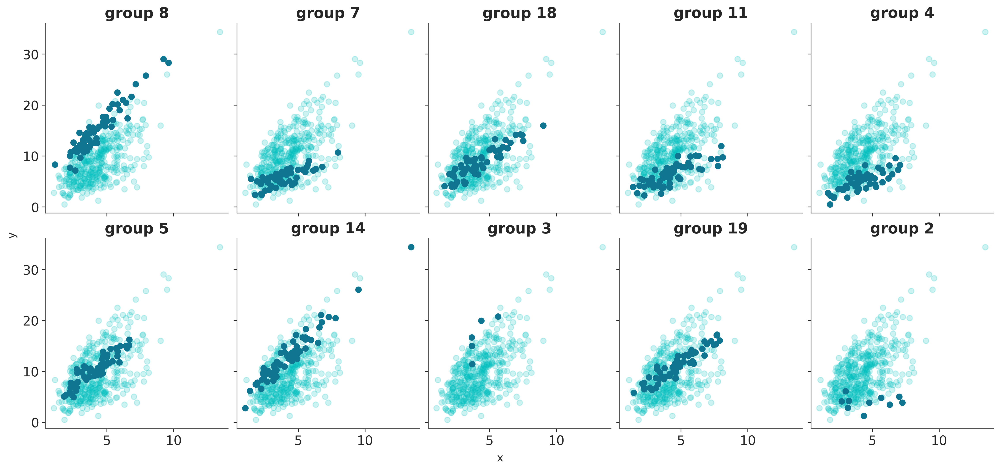

In [8]:
df = synth_df
response_var = "y"
independent_var = "x"
category_var = "group"

rng = np.random.default_rng(SEED)
random_categories = rng.choice(df[category_var].unique(), 10, replace=False)

fig, axes = plt.subplots(2, 5, figsize=(15, 7), sharex=True, sharey=True, layout="constrained")

for i, (ax, cat_id) in enumerate(zip(axes.ravel(), random_categories)):
    data_others = df.query(f"{category_var} in @random_categories")
    ax.scatter(data_others[independent_var], data_others[response_var], color="C1", alpha=0.2)
    data = df.query(f"{category_var} == @cat_id")
    ax.scatter(data[independent_var], data[response_var], color="C0")
    ax.set_title(f"{category_var} {cat_id}")

fig.supxlabel(independent_var)
fig.supylabel(response_var);

## Simple linear regression

### Model definition

In [9]:
model_formula = f"y ~ x"
simple_model = bmb.Model(model_formula, df)
simple_model

       Formula: y ~ x
        Family: gaussian
          Link: mu = identity
  Observations: 1000
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 8.9294, sigma: 33.2456)
            x ~ Normal(mu: 0.0, sigma: 7.4259)
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 4.6414)

ERROR:pytensor.graph.rewriting.basic:Rewrite failure due to: random_make_inplace
ERROR:pytensor.graph.rewriting.basic:node: t_rv{"(),(),()->()"}(*0-<RandomGeneratorType>, *1-<NoneTypeT>, *2-<Scalar(float64, shape=())>, 0.0, *3-<Scalar(float64, shape=())>)
ERROR:pytensor.graph.rewriting.basic:TRACEBACK:
ERROR:pytensor.graph.rewriting.basic:Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/pytensor/graph/rewriting/basic.py", line 1920, in process_node
    replacements = node_rewriter.transform(
                   ^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pytensor/graph/rewriting/basic.py", line 993, in transform
    return self.fn(fgraph, node)
           ^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pytensor/tensor/random/rewriting/basic.py", line 54, in random_make_inplace
    new_outputs = new_op.make_node(*node.inputs).outputs
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib

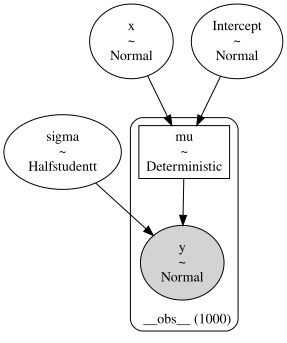

In [10]:
simple_model.build()
simple_model.backend.model.to_graphviz()

### Prior analysis

In [66]:
simple_idata = simple_model.prior_predictive(draws=2000)

In [70]:
azp.plot_convergence_dist(simple_idata)


AttributeError: module 'arviz.preview' has no attribute 'plot_convergence_dist'

### Inference
We can perform inference on a Bambi model by calling its `.fit()` method.
Here, in addition to that we are also generating several auxiliary quantities that are cheap to compute and will help us analyze the model.

In [15]:
simple_idata = simple_model.prior_predictive(draws=2000)
simple_idata.extend(simple_model.fit(idata_kwargs={"log_likelihood": True, "log_prior": True}))
simple_model.predict(simple_idata, kind="response")
simple_idata["constant_data"] = xr.Dataset({"x": (["__obs__"], x)}, coords={"__obs__": simple_idata.posterior["__obs__"]})

# add group information to data
simple_idata_extra_idx = simple_idata.map(lambda ds: ds.assign_coords(group=(["__obs__"], groups)).set_xindex("group"))

Output()

### Inference Diagnostics

In [71]:
azp.plot_convergence_dist(simple_idata)

AttributeError: module 'arviz.preview' has no attribute 'plot_convergence_dist'

### Prior sensitivity

In [72]:
azp.psense_summary(simple_idata, var_names="~mu")

AttributeError: module 'arviz.preview' has no attribute 'psense_summary'

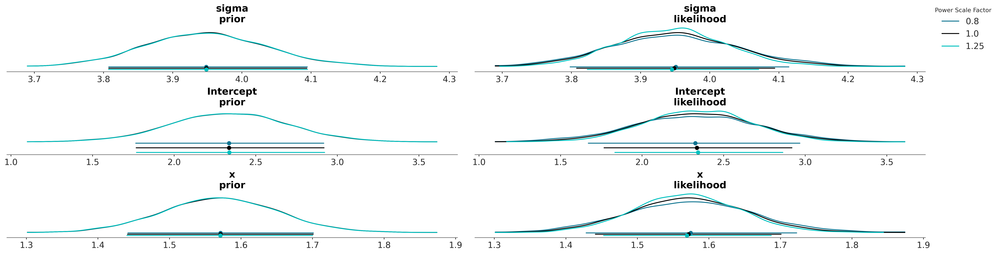

In [ ]:
azp.plot_psense_dist(simple_idata, var_names="~mu");

### Model criticism

In [73]:
azp.plot_ppc_dist(simple_idata);

AttributeError: module 'arviz.preview' has no attribute 'plot_ppc_dist'

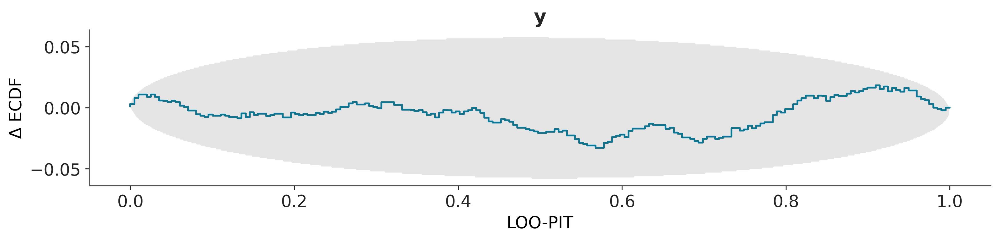

In [ ]:
azp.plot_loo_pit(simple_idata);

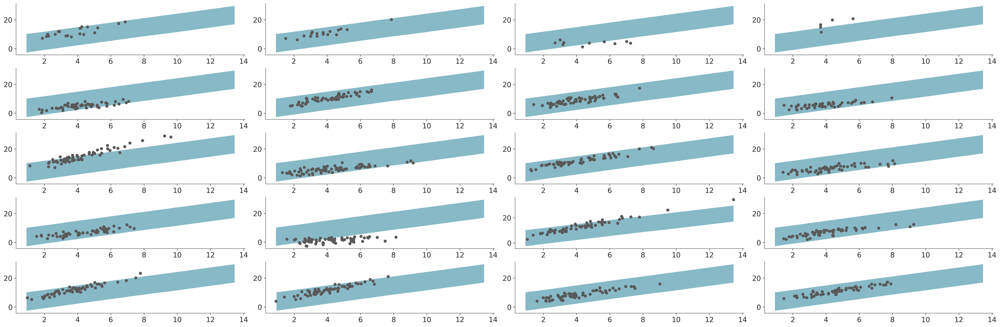

In [ ]:
azp.plot_lm(
    simple_idata_extra_idx,
    cols=["group"],
    visuals={
        "pe_line": False,
        "xlabel": False,
        "ylabel": False,
        "ci_band": {"alpha": 0.5},
        "observed_scatter": {"alpha": 1},
    },
);

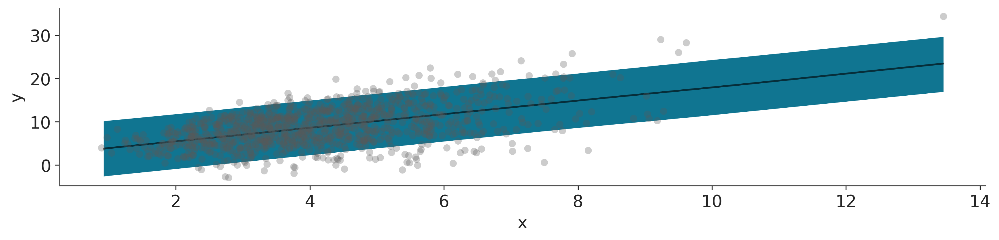

In [ ]:
azp.plot_lm(simple_idata);

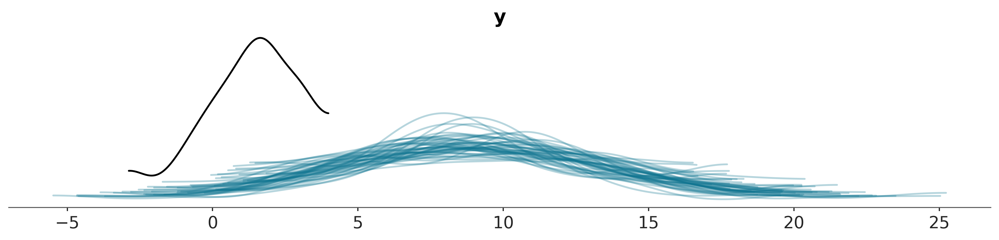

In [ ]:
azp.plot_ppc_dist(simple_idata_extra_idx, coords={"group": 13});

## Hierarchical linear regression

In [ ]:
model_formula = f"{response_var} ~ ({independent_var}|{category_var})"
hierarchical_model = bmb.Model(model_formula, df)
hierarchical_model

       Formula: y ~ (x|group)
        Family: gaussian
          Link: mu = identity
  Observations: 1000
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 8.9294, sigma: 11.6035)
        
        Group-level effects
            1|group ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 11.6035))
            x|group ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 7.4259))
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 4.6414)

In [ ]:
hierarchical_idata = hierarchical_model.fit(idata_kwargs={"log_likelihood": True, "log_prior": True})
hierarchical_idata.extend(hierarchical_model.prior_predictive(draws=2000))
hierarchical_model.predict(hierarchical_idata, kind="response")
hierarchical_idata["constant_data"] = xr.Dataset({"x": (["__obs__"], x)}, coords={"__obs__": hierarchical_idata.posterior["__obs__"]})

# add group information to data
hierarchical_idata_extra_idx = hierarchical_idata.map(lambda ds: ds.assign_coords(group=(["__obs__"], groups)).set_xindex("group"))

 Progress                    Draws   Divergences   Step size   Grad evals   Sampling Speed   Elapsed   Remaining  
 ───────────────────────────────────────────────────────────────────────────────────────────────────────────────── 
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.047       63           99.45 draws/s    0:00:20   0:00:00    
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.042       63           101.65 draws/s   0:00:19   0:00:00    
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.055       63           115.79 draws/s   0:00:17   0:00:00    
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.049       127          98.95 draws/s    0:00:20   0:00:00

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 20 seconds.
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Sampling: [1|group_offset, 1|group_sigma, Intercept, sigma, x|group_offset, x|group_sigma, y]


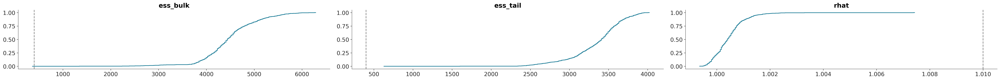

In [ ]:
azp.plot_convergence_dist(hierarchical_idata);

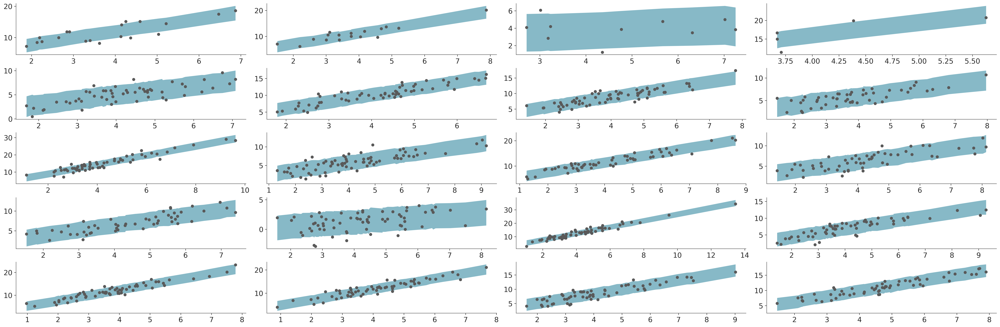

In [ ]:
pc = azp.plot_lm(
    hierarchical_idata_extra_idx,
    cols=["group"],
    visuals={
        "pe_line": False,
        "xlabel": False,
        "ylabel": False,
        "ci_band": False,
        "observed_scatter": {"alpha": 1},
    },
)
sorted_x = hierarchical_idata_extra_idx.constant_data.sortby("x")["x"]
hdi = azp.hdi(hierarchical_idata_extra_idx.posterior_predictive).sel(__obs__=sorted_x["__obs__"])
pc.map(
    azp.visuals.fill_between_y,
    x=sorted_x,
    y_bottom=hdi.sel(ci_bound="lower")["y"],
    y_top=hdi.sel(ci_bound="upper")["y"],
    alpha=0.5,
)

## No intercept

In [ ]:
model_formula = f"{response_var} ~ 0 + ({independent_var}|{category_var})"
no_intercept_model = bmb.Model(model_formula, df)
no_intercept_model

       Formula: y ~ 0 + (x|group)
        Family: gaussian
          Link: mu = identity
  Observations: 1000
        Priors: 
    target = mu
        Group-level effects
            1|group ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 11.6035))
            x|group ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 7.4259))
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 4.6414)

In [ ]:
no_intercept_idata = no_intercept_model.fit(idata_kwargs={"log_likelihood": True, "log_prior": True}, target_accept=0.95)
no_intercept_idata.extend(no_intercept_model.prior_predictive(draws=2000))
no_intercept_model.predict(no_intercept_idata, kind="response")

 Progress                    Draws   Divergences   Step size   Grad evals   Sampling Speed   Elapsed   Remaining  
 ───────────────────────────────────────────────────────────────────────────────────────────────────────────────── 
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.025       127          83.16 draws/s    0:00:24   0:00:00    
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.022       127          80.63 draws/s    0:00:24   0:00:00    
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.019       255          77.17 draws/s    0:00:25   0:00:00    
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.020       127          68.02 draws/s    0:00:29   0:00:00

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 29 seconds.
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Sampling: [1|group_offset, 1|group_sigma, sigma, x|group_offset, x|group_sigma, y]


In [ ]:
true_params = azp.dict_to_dataset(
    {"1|group": intercepts, "x|group": slopes},
    sample_dims=["group__factor_dim"],
    coords={"group__factor_dim": hierarchical_idata.posterior.group__factor_dim}
)

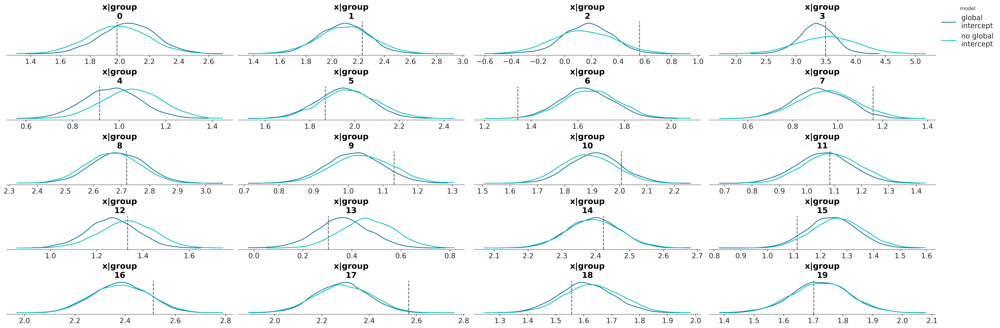

In [ ]:
target_variable = "x|group"
pc = azp.plot_dist(
    {"global\nintercept": hierarchical_idata, "no global\nintercept": no_intercept_idata},
    var_names=target_variable,
    visuals={"point_estimate": False, "point_estimate_text": False, "credible_interval": False}
)
azp.add_lines(pc, true_params[[target_variable]])
pc.add_legend("model");

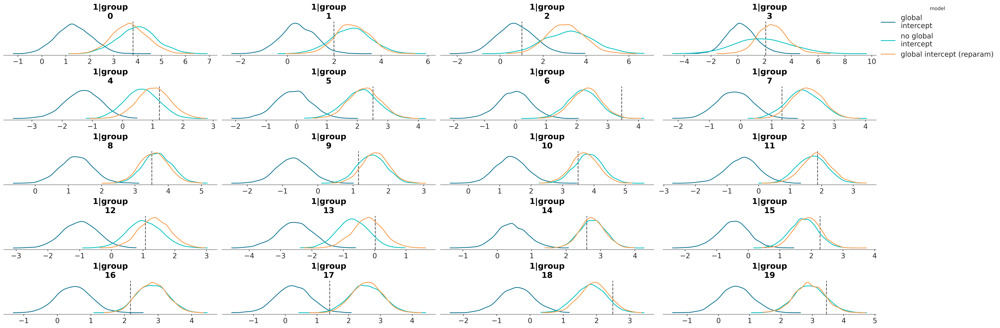

In [ ]:
effective_intercept = hierarchical_idata.posterior["Intercept"] + hierarchical_idata.posterior["1|group"]
pc = azp.plot_dist(
    {"global\nintercept": hierarchical_idata, "no global\nintercept": no_intercept_idata, "global intercept (reparam)": effective_intercept.to_dataset(name="1|group")},
    var_names="1|group",
    visuals={"point_estimate": False, "point_estimate_text": False, "credible_interval": False}
)
azp.add_lines(pc, true_params[["1|group"]])
pc.add_legend("model");

## Model comparison

In [ ]:
compare_df = azp.compare({"simple": simple_idata, "hierarchical": hierarchical_idata, "no_intercept": no_intercept_idata})
compare_df

,rank,elpd,p,elpd_diff,weight,se,dse,warning
hierarchical,0,-1679.125859,36.928506,0.000000,1.000000e+00,21.411201,0.000000,False
no_intercept,1,-1681.143341,40.165602,2.017482,0.000000e+00,21.300103,1.778212,False
simple,2,-2793.617620,3.769789,1114.491761,3.690293e-14,23.185200,28.747858,False


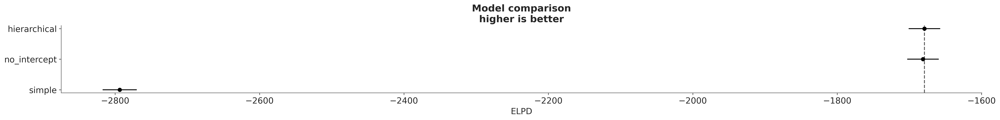

In [ ]:
azp.plot_compare(compare_df);

## Multiple hierarchical regression for rent data


In [ ]:
immo_df = pd.read_csv("berlin_rent.csv")

In [ ]:
immo_model = bmb.Model("rent ~ (living_space|zip)", immo_df)
immo_model

       Formula: rent ~ (living_space|zip)
        Family: gaussian
          Link: mu = identity
  Observations: 3570
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 1268.2479, sigma: 2322.9454)
        
        Group-level effects
            1|zip ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 2322.9454))
            living_space|zip ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 50.6896))
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 929.1782)

In [ ]:
immo_idata = immo_model.fit(idata_kwargs={"log_likelihood": True, "log_prior": True})
immo_idata.extend(immo_model.prior_predictive(draws=2000))
immo_model.predict(immo_idata, kind="response")

 Progress                    Draws   Divergences   Step size   Grad evals   Sampling Speed   Elapsed   Remaining  
 ───────────────────────────────────────────────────────────────────────────────────────────────────────────────── 
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.097       63           89.03 draws/s    0:00:22   0:00:00    
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.095       63           90.85 draws/s    0:00:22   0:00:00    
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.082       63           86.80 draws/s    0:00:23   0:00:00    
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.109       63           89.99 draws/s    0:00:22   0:00:00

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 23 seconds.
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Sampling: [1|zip_offset, 1|zip_sigma, Intercept, living_space|zip_offset, living_space|zip_sigma, rent, sigma]


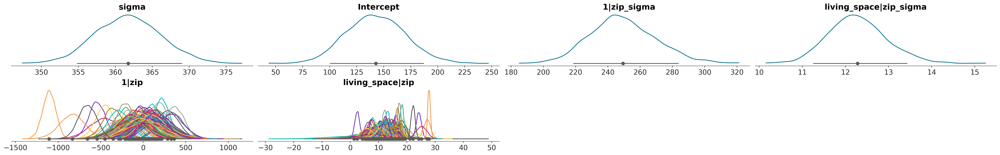

In [ ]:
azp.plot_dist(
    immo_idata,
    var_names="~mu",
    cols=["__variable__"],
    aes={"color": ["zip__factor_dim"]},
    visuals={"point_estimate_text": False}
);

In [ ]:
immo_prior_model = bmb.Model(
    "rent ~ (living_space|zip)",
    immo_df,
    priors={"living_space|zip": bmb.Prior("Gamma", mu=20, sigma=bmb.Prior("Normal", mu=15, sigma=2))},
    noncentered=False
)
immo_prior_model

       Formula: rent ~ (living_space|zip)
        Family: gaussian
          Link: mu = identity
  Observations: 3570
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 1268.2479, sigma: 2322.9454)
        
        Group-level effects
            1|zip ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 2322.9454))
            living_space|zip ~ Gamma(mu: 20.0, sigma: Normal(mu: 15.0, sigma: 2.0))
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 929.1782)

In [ ]:
immo_prior_idata = immo_prior_model.fit(idata_kwargs={"log_likelihood": True, "log_prior": True}, target_accept=0.98, max_treedepth=11)
immo_prior_idata.extend(immo_prior_model.prior_predictive(draws=2000))
immo_prior_model.predict(immo_prior_idata, kind="response")

 Progress                    Draws   Divergences   Step size   Grad evals   Sampling Speed   Elapsed   Remaining  
 ───────────────────────────────────────────────────────────────────────────────────────────────────────────────── 
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.051       127          39.45 draws/s    0:00:50   0:00:00    
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.059       127          35.95 draws/s    0:00:55   0:00:00    
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.053       127          35.37 draws/s    0:00:56   0:00:00    
  ━━━━━━━━━━━━━━━━━━━━━━━━━   2000    0             0.051       127          36.54 draws/s    0:00:54   0:00:00

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 57 seconds.
Sampling: [1|zip, 1|zip_sigma, Intercept, living_space|zip, living_space|zip_sigma, rent, sigma]


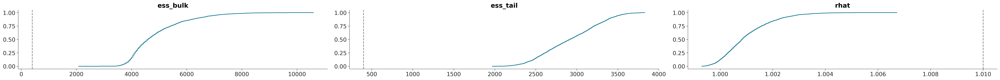

In [ ]:
azp.plot_convergence_dist(immo_prior_idata);

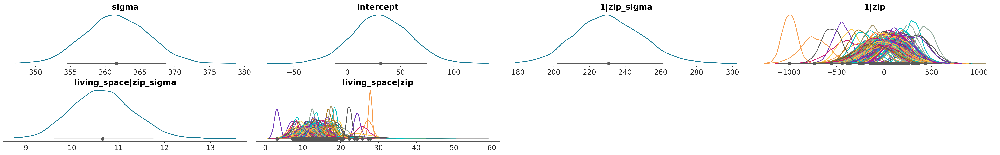

In [ ]:
azp.plot_dist(
    immo_prior_idata,
    var_names="~mu",
    cols=["__variable__"],
    aes={"color": ["zip__factor_dim"]},
    visuals={"point_estimate_text": False}
);

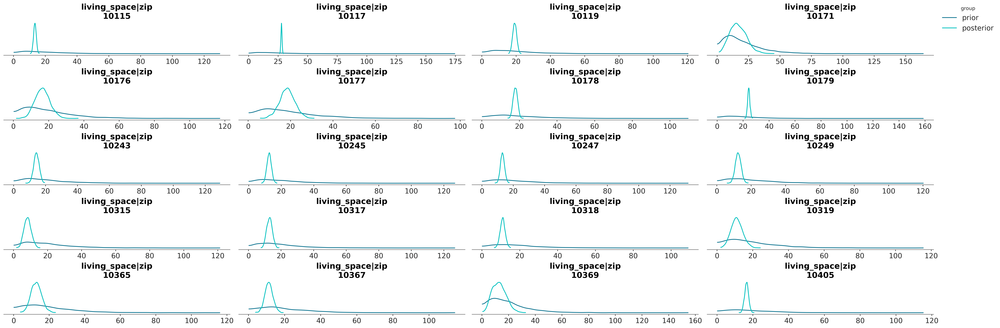

In [ ]:
azp.plot_prior_posterior(immo_prior_idata, var_names="living_space|zip", coords={"zip__factor_dim": immo_idata.posterior.zip__factor_dim[:20]});

In [ ]:
slopes_min = immo_idata.posterior["living_space|zip"].min(["chain", "draw"])
sorted_zips = immo_idata.posterior["zip__factor_dim"].sortby(slopes_min)
zips_to_plot = xr.concat((sorted_zips[:5], sorted_zips[-5:]), dim="zip__factor_dim")

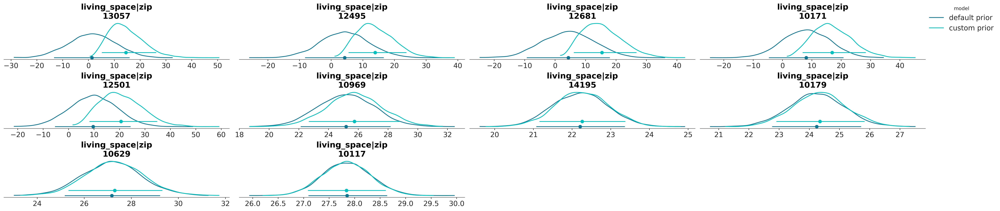

In [ ]:
pc = azp.plot_dist(
    {"default prior": immo_idata, "custom prior": immo_prior_idata},
    var_names="living_space|zip",
    coords={"zip__factor_dim": zips_to_plot},
    cols=["__variable__", "zip__factor_dim"],
    visuals={"point_estimate_text": False}
)
pc.add_legend("model");

In [ ]:
azp.psense_summary(immo_prior_idata, var_names="living_space|zip")

We detected potential issues. For more information on how to interpret the results, please check
https://arviz-devs.github.io/EABM/Chapters/Sensitivity_checks.html#interpreting-sensitivity-diagnostics-summary
or read original paper https://doi.org/10.1007/s11222-023-10366-5


,prior,likelihood,diagnosis
living_space|zip[10115],0.238,0.146,potential prior-data conflict
living_space|zip[10117],0.468,0.250,potential prior-data conflict
living_space|zip[10119],0.164,0.140,potential prior-data conflict
living_space|zip[10171],0.109,0.072,potential prior-data conflict
living_space|zip[10176],0.094,0.151,potential prior-data conflict
...,...,...,...
living_space|zip[14169],0.132,0.108,potential prior-data conflict
living_space|zip[14193],0.132,0.142,potential prior-data conflict
living_space|zip[14195],0.358,0.267,potential prior-data conflict
living_space|zip[14197],0.215,0.085,potential prior-data conflict


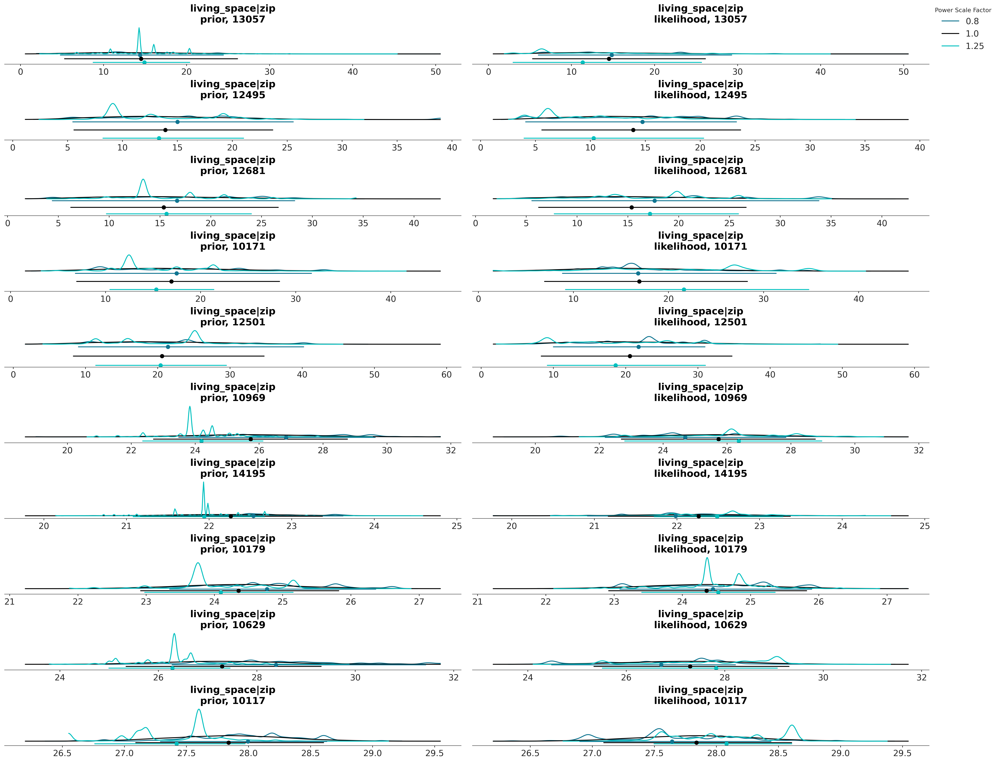

In [ ]:
azp.plot_psense_dist(
    immo_prior_idata,
    var_names="living_space|zip",
    coords={"zip__factor_dim": zips_to_plot}
);

# A jugar!

# Task
Load the "berlin_rent.csv" dataset into a pandas DataFrame, then display its head, info, and descriptive statistics. Afterwards, create histograms for the 'rent' and 'living_space' columns, and a scatter plot comparing 'living_space' and 'rent'.

## Load and inspect data

### Subtask:
Load the `berlin_rent.csv` into a DataFrame and display its head, info, and descriptive statistics.


**Reasoning**:
I need to load the `berlin_rent.csv` file into a pandas DataFrame named `berlin_rent_df`, and then display its head, info, and descriptive statistics as requested in the subtask.



In [4]:
immo_df = pd.read_csv("berlin_rent.csv")
print("DataFrame Head:")
print(immo_df.head())
print("\nDataFrame Info:")
immo_df.info()
print("\nDataFrame Descriptive Statistics:")
print(immo_df.describe())

DataFrame Head:
     zip    rent   sqm_rent  living_space  offer_year  const_year  \
0  14109  1399.7  16.999028         82.34        2019        1920   
1  13086   830.0   8.251317        100.59        2019        1912   
2  10785  3417.6  16.000000        213.60        2019        2018   
3  12057   490.0  10.000000         49.00        2019        1972   
4  13355  1150.0  17.024426         67.55        2019        2018   

       flattype  interior_qual  
0     apartment  sophisticated  
1  ground_floor         normal  
2     penthouse  sophisticated  
3     apartment         normal  
4   roof_storey  sophisticated  

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3570 entries, 0 to 3569
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   zip            3570 non-null   int64  
 1   rent           3570 non-null   float64
 2   sqm_rent       3570 non-null   float64
 3   living_space   3570 non

## Generate descriptive graphics

### Subtask:
Create histograms for 'rent' and 'living_space', and a scatter plot comparing 'living_space' and 'rent' to visualize their distributions and relationship.


/tmp/ipython-input-1463933271.py:18: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


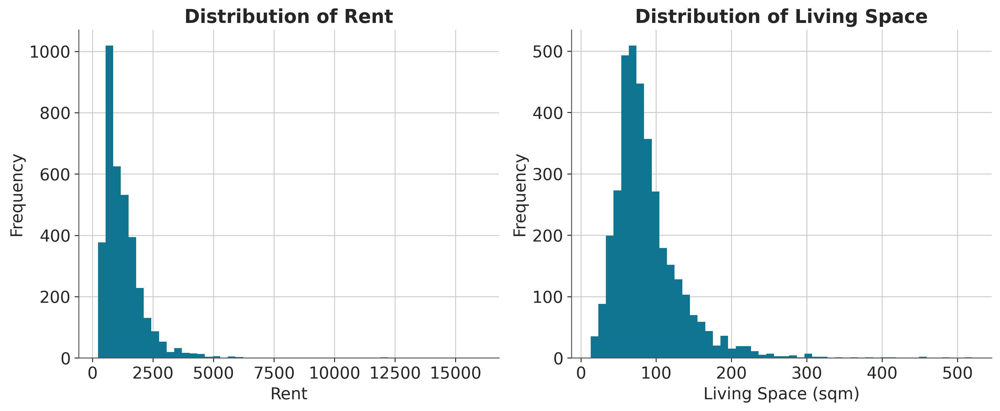

<Figure size 2400x1800 with 0 Axes>

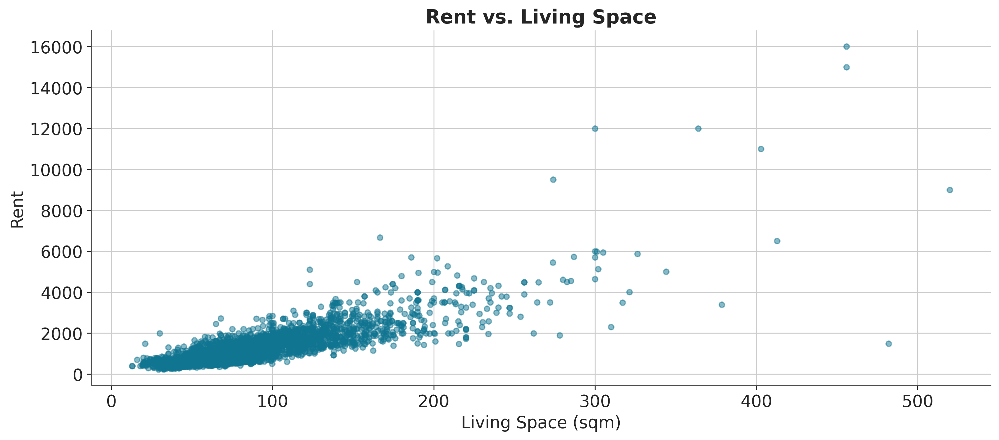

In [33]:
import matplotlib.pyplot as plt

# Create histograms for 'rent' and 'living_space'
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
immo_df['rent'].hist(bins=50)
plt.title('Distribution of Rent')
plt.xlabel('Rent')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
immo_df['living_space'].hist(bins=50)
plt.title('Distribution of Living Space')
plt.xlabel('Living Space (sqm)')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Create a scatter plot comparing 'living_space' and 'rent'
plt.figure(figsize=(8, 6))
immo_df.plot.scatter(x='living_space', y='rent', alpha=0.5)
plt.title('Rent vs. Living Space')
plt.xlabel('Living Space (sqm)')
plt.ylabel('Rent')
plt.grid(True)
plt.show()

In [40]:
model_formula = f"rent ~ living_space + interior_qual"
immo_model = bmb.Model(
    model_formula,
    immo_df,
    categorical=["interior_qual"],
    priors={
        "interior_qual": bmb.Prior("Normal", mu=0, sigma=1),
        "Intercept": bmb.Prior("Normal", mu=0, sigma=2),
        "sigma": bmb.Prior("HalfNormal", sigma=1)
    }
)


immo_model

       Formula: rent ~ living_space + interior_qual
        Family: gaussian
          Link: mu = identity
  Observations: 3570
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 0.0, sigma: 2.0)
            living_space ~ Normal(mu: 0.0, sigma: 50.6896)
            interior_qual ~ Normal(mu: 0.0, sigma: 1.0)
        
        Auxiliary parameters
            sigma ~ HalfNormal(sigma: 1.0)

# Task
Fit the `immo_model` to obtain the posterior samples, then visualize the convergence of the fitted model using `azp.plot_convergence_dist`, and finally display the posterior distributions of the model parameters using `azp.plot_dist`.

## Fit model and get posterior

### Subtask:
Fit the `immo_model` to obtain the posterior samples.


**Reasoning**:
The subtask requires fitting the `immo_model` and storing the inference data, so I will use the `.fit()` method with the specified `idata_kwargs`.



In [47]:
immo_idata = immo_model.fit(idata_kwargs={"log_likelihood": True, "log_prior": True})

Output()

**Reasoning**:
Now that the model has been fitted, I will visualize the convergence of the fitted model using `azp.plot_convergence_dist` to check the sampling quality.



**Reasoning**:
The previous code failed because `arviz.preview` does not have an attribute `plot_convergence_dist`. To visualize convergence, I will use `az.plot_trace` from the core `arviz` library, which is a standard method for inspecting the sampling chains and posterior distributions.



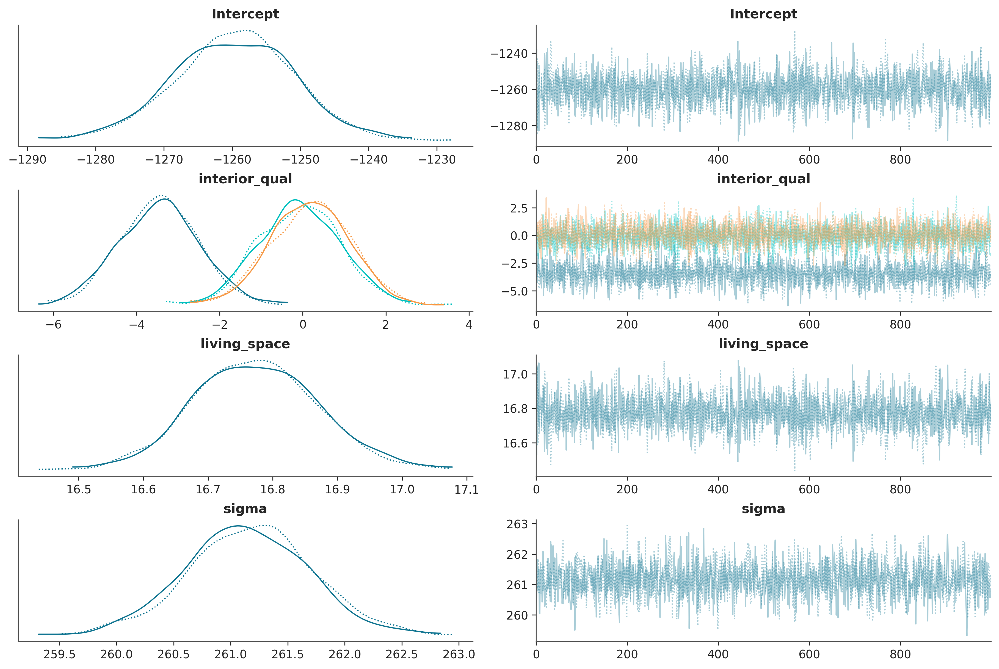

In [43]:
az.plot_trace(immo_idata);

**Reasoning**:
Now that the model has been fitted and convergence has been visually inspected, I will display the posterior distributions of the model parameters using `azp.plot_dist` to understand the parameter estimates.



In [48]:
azp.plot_dist(immo_idata);

AttributeError: module 'arviz.preview' has no attribute 'plot_dist'

**Reasoning**:
The previous code failed because `arviz.preview` does not have an attribute `plot_dist`. To display the posterior distributions, I will use `az.plot_posterior` from the core `arviz` library, which is the correct function for this task.



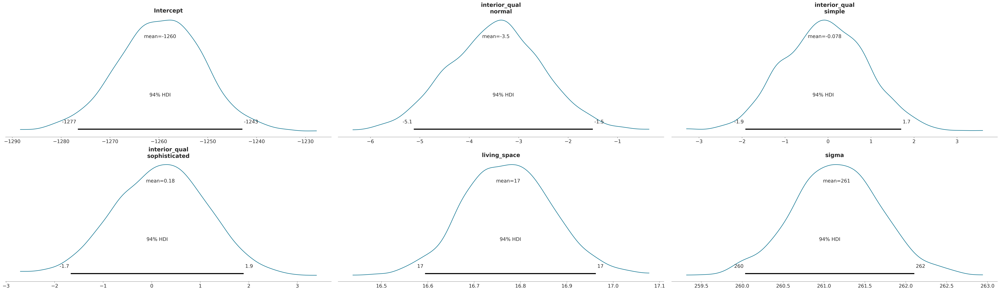

In [45]:
az.plot_posterior(immo_idata);

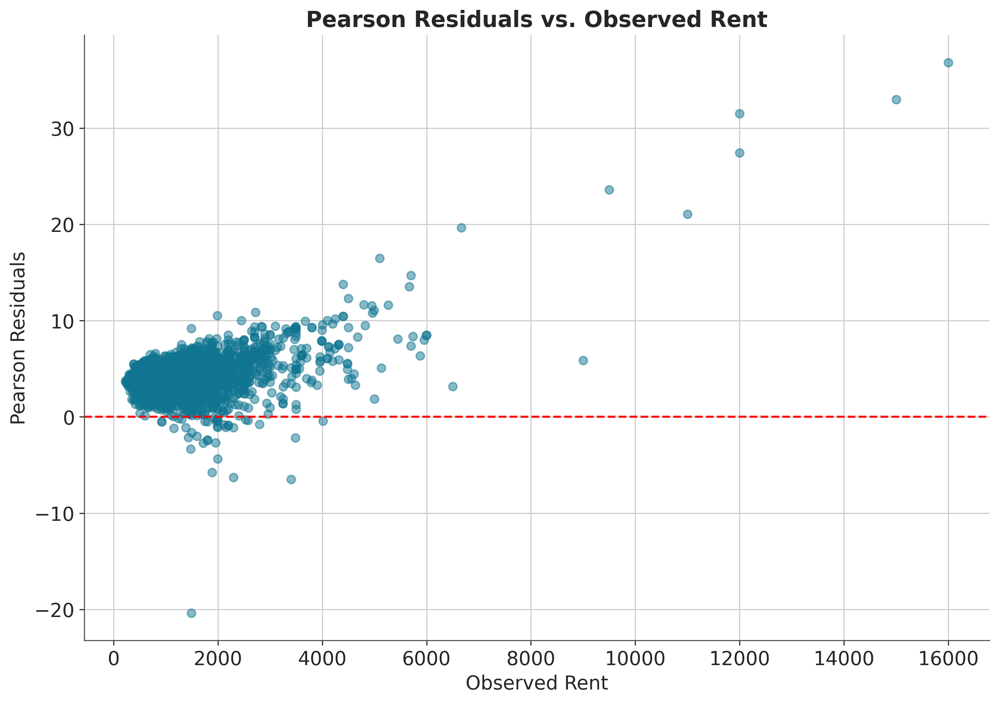

In [50]:
# Calculate Pearson residuals
observed_rent = immo_idata.observed_data['rent']
predicted_rent_mean = immo_idata.posterior_predictive['rent'].mean(dim=['chain', 'draw'])
sigma_mean = immo_idata.posterior['sigma'].mean(dim=['chain', 'draw'])

pearson_residuals = (observed_rent - predicted_rent_mean) / sigma_mean

# Plot Pearson residuals against observed values
plt.figure(figsize=(10, 7))
plt.scatter(observed_rent, pearson_residuals, alpha=0.5)
plt.title('Pearson Residuals vs. Observed Rent')
plt.xlabel('Observed Rent')
plt.ylabel('Pearson Residuals')
plt.axhline(0, color='red', linestyle='--') # Add a horizontal line at 0 for reference
plt.grid(True)
plt.show()

### Canviar link

In [ ]:
model_formula = f"rent ~ living_space|interior_qual"
immo_model2 = bmb.Model(
    model_formula,
    immo_df,
    categorical=["interior_qual"],
    priors={
        "interior_qual": bmb.Prior("Normal", mu=10, sigma=10),
        "Intercept": bmb.Prior("Normal", mu=10, sigma=100),
        "sigma": bmb.Prior("HalfNormal", sigma=1)
    },
    link = "log"
)


immo_model2

In [11]:
immo_idata2 = immo_model2.fit(idata_kwargs={"log_likelihood": True, "log_prior": True})
immo_model2.predict(immo_idata2, kind="response")

Output()

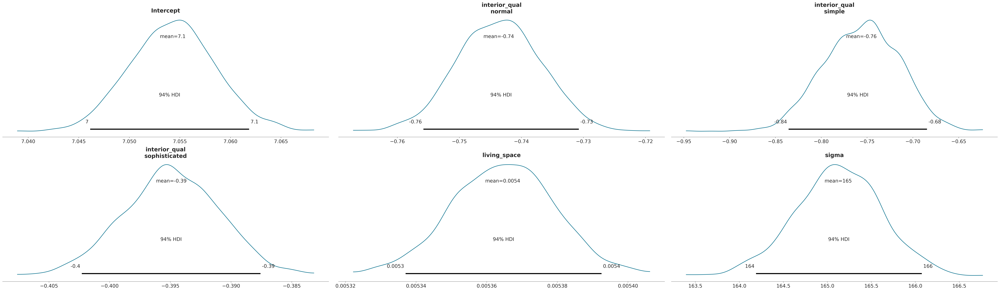

In [54]:
az.plot_posterior(immo_idata2);

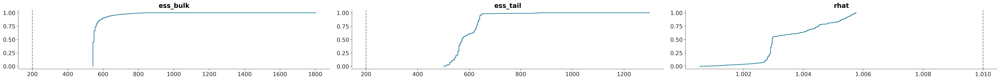

In [12]:
azp.plot_convergence_dist(immo_idata2);

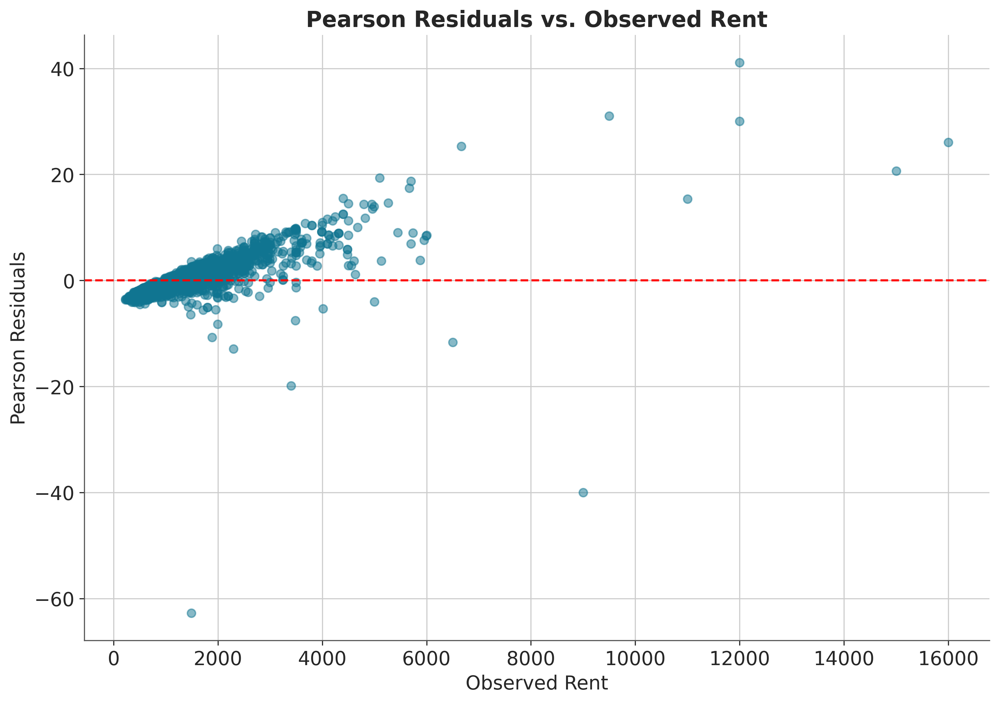

In [13]:
# Calculate Pearson residuals
observed_rent = immo_idata2.observed_data['rent']
predicted_rent_mean = immo_idata2.posterior_predictive['rent'].mean(dim=['chain', 'draw'])
sigma_mean = immo_idata2.posterior['sigma'].mean(dim=['chain', 'draw'])

pearson_residuals = (observed_rent - predicted_rent_mean) / sigma_mean

# Plot Pearson residuals against observed values
plt.figure(figsize=(10, 7))
plt.scatter(observed_rent, pearson_residuals, alpha=0.5)
plt.title('Pearson Residuals vs. Observed Rent')
plt.xlabel('Observed Rent')
plt.ylabel('Pearson Residuals')
plt.axhline(0, color='red', linestyle='--') # Add a horizontal line at 0 for reference
plt.grid(True)
plt.show()